# Анализ фондового рынка. 

<b>Описание проекта</b><br>
Из импортированных файлов  с информацией о динамике цен акций на фондовом рынке необходимо собрать датафрейм, осуществить предобработку, добавить метрики и провести исследовательский анализ цены за последние 3 года. В исследовании использовать скользящие средние, экспотенциальные скользящие средние и RSI индикатор.



**Задание**
1. Загрузите информацию об акциях (не менее пяти тикеров) с сайте finam.ru с параметрами:
Интервал: 3 года, периодичность 1 день.
Формат записи в файл:
<TICKER>	<PER>	<DATE>	<TIME>	<OPEN>	<HIGH>	<LOW>	<CLOSE>	<VOL>
https://www.finam.ru/quote/moex/gazp/export/
2. Соберите информацию из файлов в единый датафрейм (используйте дополнительные библиотеки).
3. Осуществите предобработку дат и заголовков.
4. Постройте линейные графики динамики цены для каждой акции (реализуйте в цикле).
5. Для каждой акции найдите дни максимального изменения цены (взлета и падения). Составьте отчет.
6. Найдите скользящие средние (периоды 10, 50, 100) для каждой акции. Добавьте на график.
7. Постройте в цикле графики объема (volume) для каждого тикера.
8. Реализуйте в цикле для каждого тикера последовательно: график цены вместе с скользящими средними с периодом 50, 100 и график объема, реализуйте с помощью функции. На вход функция принимает два параметра: тикер и год.
9. Добавьте экспоненциальные скользящие средние для каждого тикера с периодом 50.
10. Осуществите расчет индикатора RSI.
11.  Создайте функцию для вывода графиков: цены, скользящей средней (тип и период определите самостоятельно) и отдельный график для RSI индикатора. На графике с RSI добавьте две красные линии на уровнях 70 и 30. На вход функция принимает два параметра: тикер и год. <br>

Работу сопроводите комментариями к коду и выводами. 

**Дополнительная задача**<br>
Постройте модель прогноза цены акции

**Дополнительная информация**
1. Экпорт файлов осуществите с сайта:
https://www.finam.ru/quote/moex/gazp/export/
2. Для получения файлов из заданной директории используйте:

import glob<br>
globbed_files = glob.glob(path) # список файлов<br>

3. Информация про индикатор RSI
на БКС Экспресс:<br>
https://bcs-express.ru/novosti-i-analitika/indeks-otnositel-noi-sily-rsi-relative-strength-index<br>
Почитать еще про RSI:<br>
https://ru.tradingview.com/chart/BTCUSD/Eq8tysZA-indikator-rsi-sekrety-torgovli-pravila-primeneniya-polnyj-razbor/

3. Допустима загрузка исторических данных с помощью tinkoff invest api вместо экспорта с finam.ru

**Дополнительная задача**<br>
Постройте модель прогноза цены акции

In [108]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

<img src="https://media1.tenor.com/m/LvRDGgDmFxIAAAAd/dancing-anime.gif" width="232" height="245.41"/>

<h2>Выгрузка данных</h2>

<u>Этот текст я пишу, когда мне осталось только дописать выводы к последнему заданию (из основных)
<br>Я только сейчас увидел, как надо было выгружать данные
<br>/я вручную сохранял файлы с сайта финама/
<br>чтобы работу можно было проверить и запустить, все файлы приложу в общем архиве</u>

In [109]:
  # Газпром
gazp = pd.read_csv('GAZP_2021_2024.csv', sep=';')
gazp

,<TICKER>,<PER>,<DATE>,<TIME>,<OPEN>,<HIGH>,<LOW>,<CLOSE>,<VOL>
0,GAZP,D,20211215,0,319.65,325.83,316.50,324.09,79742820
1,GAZP,D,20211216,0,326.18,332.30,325.38,328.39,95469330
2,GAZP,D,20211217,0,327.98,329.70,323.03,327.30,72099410
3,GAZP,D,20211220,0,324.00,326.00,316.11,325.90,70795770
4,GAZP,D,20211221,0,326.75,339.88,326.50,339.88,80061070
...,...,...,...,...,...,...,...,...,...
739,GAZP,D,20241209,0,115.73,117.86,115.00,117.06,41812820
740,GAZP,D,20241210,0,117.39,117.47,114.50,114.70,38655660
741,GAZP,D,20241211,0,114.60,116.00,113.75,115.16,47528480
742,GAZP,D,20241212,0,115.16,115.40,113.00,113.10,40209450


In [110]:
  # Метровагонмаш (мало)
mtvg = pd.read_csv('MTVG_2021_2024.csv', sep=';')
mtvg

,<TICKER>,<PER>,<DATE>,<TIME>,<OPEN>,<HIGH>,<LOW>,<CLOSE>,<VOL>
0,MTVG,D,20240917,0,76000,93000,76000,93000,3
1,MTVG,D,20240918,0,73000,75000,73000,75000,3
2,MTVG,D,20240919,0,74000,75000,74000,75000,4
3,MTVG,D,20240927,0,74500,74500,74500,74500,2
4,MTVG,D,20240930,0,74500,74500,74500,74500,4
5,MTVG,D,20241001,0,74500,74500,74500,74500,2
6,MTVG,D,20241002,0,74500,74500,74500,74500,7
7,MTVG,D,20241004,0,73000,73000,73000,73000,1
8,MTVG,D,20241008,0,74000,74000,74000,74000,1
9,MTVG,D,20241009,0,73000,73000,73000,73000,2


In [111]:
  # Татнефть (вместо Метровагонмаша)
tatn = pd.read_csv('TATN_2021_2024.csv', sep=';')
tatn

,<TICKER>,<PER>,<DATE>,<TIME>,<OPEN>,<HIGH>,<LOW>,<CLOSE>,<VOL>
0,TATN,D,20211215,0,464.6,480.0,462.1,479.3,4383993
1,TATN,D,20211216,0,480.2,489.0,476.2,483.1,5724765
2,TATN,D,20211217,0,482.2,489.8,479.4,487.6,5813887
3,TATN,D,20211220,0,481.1,484.9,474.5,481.4,3981178
4,TATN,D,20211221,0,487.3,488.9,478.3,484.2,2602090
...,...,...,...,...,...,...,...,...,...
739,TATN,D,20241209,0,560.5,575.5,560.4,566.2,3631770
740,TATN,D,20241210,0,564.8,568.8,556.0,564.9,4745050
741,TATN,D,20241211,0,564.4,574.9,561.7,574.1,3165521
742,TATN,D,20241212,0,574.0,581.6,556.5,557.8,3474331


In [112]:
  # Объединённая вагонная компания
uwgn = pd.read_csv('UWGN_2021_2024.csv', sep=';')
uwgn

,<TICKER>,<PER>,<DATE>,<TIME>,<OPEN>,<HIGH>,<LOW>,<CLOSE>,<VOL>
0,UWGN,D,20211215,0,68.90,73.40,68.0,71.7,105120
1,UWGN,D,20211216,0,72.20,81.60,71.9,78.7,272845
2,UWGN,D,20211217,0,78.80,79.00,73.0,76.5,62627
3,UWGN,D,20211220,0,76.60,77.00,71.2,72.0,110099
4,UWGN,D,20211221,0,72.40,75.00,72.2,72.9,57621
...,...,...,...,...,...,...,...,...,...
737,UWGN,D,20241209,0,47.25,48.60,47.1,47.9,7503726
738,UWGN,D,20241210,0,47.75,47.80,45.8,46.0,4912916
739,UWGN,D,20241211,0,45.95,46.75,45.2,46.6,4926444
740,UWGN,D,20241212,0,46.60,46.90,45.0,45.6,3327949


In [113]:
  # ИнтерРАО
irao = pd.read_csv('IRAO_2021_2024.csv', sep=';')
irao

,<TICKER>,<PER>,<DATE>,<TIME>,<OPEN>,<HIGH>,<LOW>,<CLOSE>,<VOL>
0,IRAO,D,20211215,0,4.3175,4.3395,4.2325,4.3395,172602300
1,IRAO,D,20211216,0,4.3425,4.3730,4.2790,4.2970,362170900
2,IRAO,D,20211217,0,4.2970,4.3025,4.2120,4.2530,313298100
3,IRAO,D,20211220,0,4.2320,4.2360,4.0600,4.1125,369325100
4,IRAO,D,20211221,0,4.1240,4.1810,4.1220,4.1560,298956500
...,...,...,...,...,...,...,...,...,...
739,IRAO,D,20241209,0,3.7115,3.7400,3.6780,3.7100,90190600
740,IRAO,D,20241210,0,3.7085,3.7095,3.6115,3.6255,93890500
741,IRAO,D,20241211,0,3.6185,3.6325,3.5810,3.6250,94993100
742,IRAO,D,20241212,0,3.6300,3.6355,3.5700,3.5925,64748600


In [114]:
  # ВТБ
vtbr = pd.read_csv('VTBR_2021_2024.csv', sep=';')
vtbr

,<TICKER>,<PER>,<DATE>,<TIME>,<OPEN>,<HIGH>,<LOW>,<CLOSE>,<VOL>
0,VTBR,D,20211215,0,222.500,224.400,217.300,223.975,12206770
1,VTBR,D,20211216,0,224.000,233.550,223.975,231.200,17615504
2,VTBR,D,20211217,0,230.725,236.650,228.175,234.525,13007152
3,VTBR,D,20211220,0,232.500,232.975,226.750,231.825,13203770
4,VTBR,D,20211221,0,232.550,237.375,230.300,236.700,11178494
...,...,...,...,...,...,...,...,...,...
735,VTBR,D,20241209,0,67.930,68.800,67.540,68.100,18779455
736,VTBR,D,20241210,0,68.200,68.220,66.680,66.940,21669843
737,VTBR,D,20241211,0,66.940,67.850,66.490,67.810,18176567
738,VTBR,D,20241212,0,68.000,68.660,66.500,66.570,24591292


In [115]:
  # Горьковский Авомобильный Завод
gaza = pd.read_csv('GAZA_2021_2024.csv', sep=';')
gaza

,<TICKER>,<PER>,<DATE>,<TIME>,<OPEN>,<HIGH>,<LOW>,<CLOSE>,<VOL>
0,GAZA,D,20211215,0,464.5,471.0,450.5,452.0,840
1,GAZA,D,20211216,0,461.5,462.5,452.0,458.0,1010
2,GAZA,D,20211217,0,460.0,460.0,445.0,445.5,1220
3,GAZA,D,20211220,0,454.0,455.0,438.5,440.0,1050
4,GAZA,D,20211221,0,447.0,454.5,447.0,454.0,200
...,...,...,...,...,...,...,...,...,...
736,GAZA,D,20241209,0,637.0,697.0,625.0,654.0,350
737,GAZA,D,20241210,0,683.0,683.0,634.0,645.0,160
738,GAZA,D,20241211,0,644.0,644.0,642.0,642.0,130
739,GAZA,D,20241212,0,642.0,646.0,635.0,646.0,70


In [116]:
pd.merge(irao['<CLOSE>'], gaza['<CLOSE>'], how='outer', left_on=irao['<DATE>'], right_on=gaza['<DATE>'])['<CLOSE>_y']

0      452.0
1      458.0
2      445.5
3      440.0
4      454.0
       ...  
739    654.0
740    645.0
741    642.0
742    646.0
743    612.0
Name: <CLOSE>_y, Length: 744, dtype: float64

<strong>Котировки</strong>

In [117]:
btw_price = pd.DataFrame()
btw_price['Date'] = pd.to_datetime(irao['<DATE>'], format='%Y%m%d')
btw_price['GAZA'] = pd.merge(irao['<CLOSE>'], gaza['<CLOSE>'], how='outer', left_on=irao['<DATE>'], right_on=gaza['<DATE>'])['<CLOSE>_y'].ffill()
btw_price['GAZP'] = pd.merge(irao['<CLOSE>'], gazp['<CLOSE>'], how='outer', left_on=irao['<DATE>'], right_on=gazp['<DATE>'])['<CLOSE>_y']
btw_price['IRAO'] = irao['<CLOSE>']
btw_price['TATN'] = pd.merge(irao['<CLOSE>'], tatn['<CLOSE>'], how='outer', left_on=irao['<DATE>'], right_on=tatn['<DATE>'])['<CLOSE>_y']
btw_price['UWGN'] = pd.merge(irao['<CLOSE>'], uwgn['<CLOSE>'], how='outer', left_on=irao['<DATE>'], right_on=uwgn['<DATE>'])['<CLOSE>_y'].ffill()
btw_price['VTBR'] = pd.merge(irao['<CLOSE>'], vtbr['<CLOSE>'], how='outer', left_on=irao['<DATE>'], right_on=vtbr['<DATE>'])['<CLOSE>_y'].ffill()
btw_price

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR
0,2021-12-15,452.0,324.09,4.3395,479.3,71.7,223.975
1,2021-12-16,458.0,328.39,4.2970,483.1,78.7,231.200
2,2021-12-17,445.5,327.30,4.2530,487.6,76.5,234.525
3,2021-12-20,440.0,325.90,4.1125,481.4,72.0,231.825
4,2021-12-21,454.0,339.88,4.1560,484.2,72.9,236.700
...,...,...,...,...,...,...,...
739,2024-12-09,654.0,117.06,3.7100,566.2,47.9,68.100
740,2024-12-10,645.0,114.70,3.6255,564.9,46.0,66.940
741,2024-12-11,642.0,115.16,3.6250,574.1,46.6,67.810
742,2024-12-12,646.0,113.10,3.5925,557.8,45.6,66.570


In [118]:
btw_price.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 744 entries, 0 to 743
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    744 non-null    datetime64[ns]
 1   GAZA    744 non-null    float64       
 2   GAZP    744 non-null    float64       
 3   IRAO    744 non-null    float64       
 4   TATN    744 non-null    float64       
 5   UWGN    744 non-null    float64       
 6   VTBR    744 non-null    float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 40.8 KB


<strong>Объёмы продаж</strong>

In [119]:
btw_volume = pd.DataFrame()
btw_volume['Date'] = pd.to_datetime(irao['<DATE>'], format='%Y%m%d')
btw_volume['GAZA'] = pd.merge(irao['<VOL>'], gaza['<VOL>'], how='outer', left_on=irao['<DATE>'], right_on=gaza['<DATE>'])['<VOL>_y'].fillna(0)
btw_volume['GAZP'] = pd.merge(irao['<VOL>'], gazp['<VOL>'], how='outer', left_on=irao['<DATE>'], right_on=gazp['<DATE>'])['<VOL>_y']
btw_volume['IRAO'] = irao['<VOL>']
btw_volume['TATN'] = pd.merge(irao['<VOL>'], tatn['<VOL>'], how='outer', left_on=irao['<DATE>'], right_on=tatn['<DATE>'])['<VOL>_y']
btw_volume['UWGN'] = pd.merge(irao['<VOL>'], uwgn['<VOL>'], how='outer', left_on=irao['<DATE>'], right_on=uwgn['<DATE>'])['<VOL>_y'].fillna(0)
btw_volume['VTBR'] = pd.merge(irao['<VOL>'], vtbr['<VOL>'], how='outer', left_on=irao['<DATE>'], right_on=vtbr['<DATE>'])['<VOL>_y'].fillna(0)
btw_volume

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR
0,2021-12-15,840.0,79742820,172602300,4383993,105120.0,12206770.0
1,2021-12-16,1010.0,95469330,362170900,5724765,272845.0,17615504.0
2,2021-12-17,1220.0,72099410,313298100,5813887,62627.0,13007152.0
3,2021-12-20,1050.0,70795770,369325100,3981178,110099.0,13203770.0
4,2021-12-21,200.0,80061070,298956500,2602090,57621.0,11178494.0
...,...,...,...,...,...,...,...
739,2024-12-09,350.0,41812820,90190600,3631770,7503726.0,18779455.0
740,2024-12-10,160.0,38655660,93890500,4745050,4912916.0,21669843.0
741,2024-12-11,130.0,47528480,94993100,3165521,4926444.0,18176567.0
742,2024-12-12,70.0,40209450,64748600,3474331,3327949.0,24591292.0


In [120]:
btw_volume.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 744 entries, 0 to 743
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    744 non-null    datetime64[ns]
 1   GAZA    744 non-null    float64       
 2   GAZP    744 non-null    int64         
 3   IRAO    744 non-null    int64         
 4   TATN    744 non-null    int64         
 5   UWGN    744 non-null    float64       
 6   VTBR    744 non-null    float64       
dtypes: datetime64[ns](1), float64(3), int64(3)
memory usage: 40.8 KB


<strong>Изменение котировок</strong>

In [121]:
btw_price.T

,0,1,2,3,4,5,6,7,8,9,...,734,735,736,737,738,739,740,741,742,743
Date,2021-12-15 00:00:00,2021-12-16 00:00:00,2021-12-17 00:00:00,2021-12-20 00:00:00,2021-12-21 00:00:00,2021-12-22 00:00:00,2021-12-23 00:00:00,2021-12-24 00:00:00,2021-12-27 00:00:00,2021-12-28 00:00:00,...,2024-12-02 00:00:00,2024-12-03 00:00:00,2024-12-04 00:00:00,2024-12-05 00:00:00,2024-12-06 00:00:00,2024-12-09 00:00:00,2024-12-10 00:00:00,2024-12-11 00:00:00,2024-12-12 00:00:00,2024-12-13 00:00:00
GAZA,452.0,458.0,445.5,440.0,454.0,452.5,443.0,452.0,447.0,440.0,...,620.0,620.0,652.0,647.0,637.0,654.0,645.0,642.0,646.0,612.0
GAZP,324.09,328.39,327.3,325.9,339.88,345.55,339.81,338.79,343.97,343.23,...,123.9,121.48,115.3,116.63,114.99,117.06,114.7,115.16,113.1,112.86
IRAO,4.3395,4.297,4.253,4.1125,4.156,4.186,4.175,4.159,4.2145,4.235,...,3.8605,3.7215,3.6265,3.718,3.705,3.71,3.6255,3.625,3.5925,3.602
TATN,479.3,483.1,487.6,481.4,484.2,489.0,483.9,482.0,490.4,496.4,...,548.5,538.5,521.6,547.5,558.9,566.2,564.9,574.1,557.8,571.6
UWGN,71.7,78.7,76.5,72.0,72.9,73.0,75.2,75.5,74.4,72.1,...,48.95,47.0,45.4,46.85,46.6,47.9,46.0,46.6,45.6,45.0
VTBR,223.975,231.2,234.525,231.825,236.7,237.875,236.0,235.45,238.65,241.975,...,69.27,67.28,65.38,66.95,67.52,68.1,66.94,67.81,66.57,66.38


In [122]:
btw_delt = pd.DataFrame({'Date':[], 'GAZA':[], 'GAZP':[], 'IRAO':[], 'TATN':[], 'UWGN':[], 'VTBR':[]})

In [123]:
for i in range(btw_price.shape[0] - 1):
    btw_delt.loc[i, 'Date'] = btw_price.loc[i + 1, 'Date']
    btw_delt.loc[i, 'GAZA'] = btw_price.loc[i + 1, 'GAZA'] - btw_price.loc[i, 'GAZA']
    btw_delt.loc[i, 'GAZP'] = btw_price.loc[i + 1, 'GAZP'] - btw_price.loc[i, 'GAZP']
    btw_delt.loc[i, 'IRAO'] = btw_price.loc[i + 1, 'IRAO'] - btw_price.loc[i, 'IRAO']
    btw_delt.loc[i, 'TATN'] = btw_price.loc[i + 1, 'TATN'] - btw_price.loc[i, 'TATN']
    btw_delt.loc[i, 'UWGN'] = btw_price.loc[i + 1, 'UWGN'] - btw_price.loc[i, 'UWGN']
    btw_delt.loc[i, 'VTBR'] = btw_price.loc[i + 1, 'VTBR'] - btw_price.loc[i, 'VTBR']
    i += 1

btw_delt['Date'] = pd.to_datetime(btw_delt['Date'])
btw_delt

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR
0,2021-12-16,6.0,4.30,-0.0425,3.8,7.0,7.225
1,2021-12-17,-12.5,-1.09,-0.0440,4.5,-2.2,3.325
2,2021-12-20,-5.5,-1.40,-0.1405,-6.2,-4.5,-2.700
3,2021-12-21,14.0,13.98,0.0435,2.8,0.9,4.875
4,2021-12-22,-1.5,5.67,0.0300,4.8,0.1,1.175
...,...,...,...,...,...,...,...
738,2024-12-09,17.0,2.07,0.0050,7.3,1.3,0.580
739,2024-12-10,-9.0,-2.36,-0.0845,-1.3,-1.9,-1.160
740,2024-12-11,-3.0,0.46,-0.0005,9.2,0.6,0.870
741,2024-12-12,4.0,-2.06,-0.0325,-16.3,-1.0,-1.240


In [124]:
btw_delt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 743 entries, 0 to 742
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    743 non-null    datetime64[ns]
 1   GAZA    743 non-null    float64       
 2   GAZP    743 non-null    float64       
 3   IRAO    743 non-null    float64       
 4   TATN    743 non-null    float64       
 5   UWGN    743 non-null    float64       
 6   VTBR    743 non-null    float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 62.6 KB


<h2>Графики цены</h2>

In [125]:
btw_price

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR
0,2021-12-15,452.0,324.09,4.3395,479.3,71.7,223.975
1,2021-12-16,458.0,328.39,4.2970,483.1,78.7,231.200
2,2021-12-17,445.5,327.30,4.2530,487.6,76.5,234.525
3,2021-12-20,440.0,325.90,4.1125,481.4,72.0,231.825
4,2021-12-21,454.0,339.88,4.1560,484.2,72.9,236.700
...,...,...,...,...,...,...,...
739,2024-12-09,654.0,117.06,3.7100,566.2,47.9,68.100
740,2024-12-10,645.0,114.70,3.6255,564.9,46.0,66.940
741,2024-12-11,642.0,115.16,3.6250,574.1,46.6,67.810
742,2024-12-12,646.0,113.10,3.5925,557.8,45.6,66.570


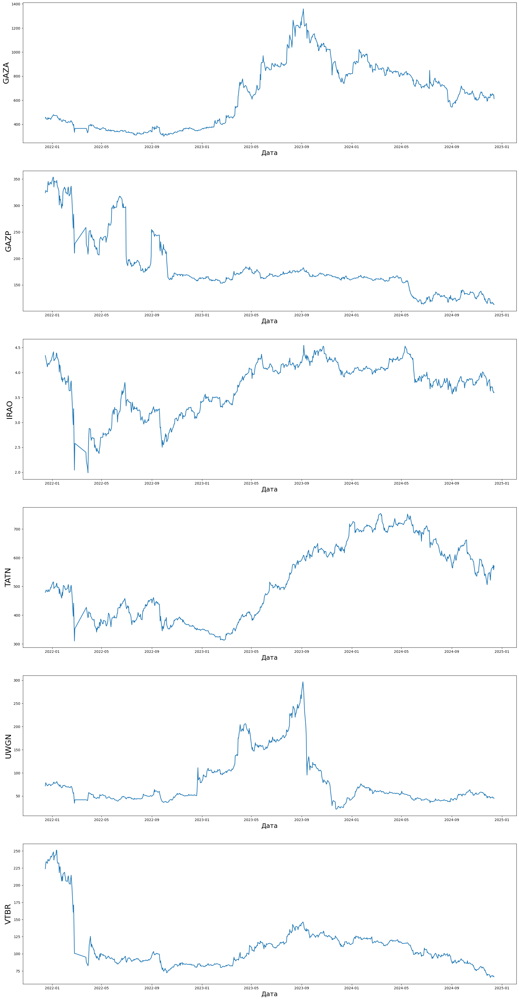

In [126]:
fig, ax = plt.subplots(6, 1, figsize=(25, 50))
x = np.array(btw_price['Date'])

for i in range(6):
    ax[i].plot(x, btw_price.iloc[:, i+1], linewidth=1.8)
    ax[i].set_xlabel('Дата', fontsize=18)
    ax[i].set_ylabel(btw_price.columns[i+1], fontsize=22)
    i += 1

plt.show()

<i>Выводы:
<br>1. Для ГАЗа период наибольшего роста приходится на февраль-сентябрь 2023
<br>2. Газпром стабильно падает на протяжении всего периода с коротками по продолжительности скачками цены
<br>3. ИнтерРАО стремительно просел в феврале-апреле 2022 и только к сентябрю 2023 вернулся к старым показателям с тенденцией к снижению
<br>4. Акции Татнефти быстро росли с марта 2023 по май 2024, а затем начали снижаться в цене
<br>5. Акции ОВК скачкообразно росли с января по сентябрь 2023, а затем обвалились
<br>6. Акции ВТБ обвалилсь в начале 2022 года, сменили тенденцию к росту к сентябрю 2022, росли до сентября 2023, но вернули только половину падения и более тенденций к росту не имеют
</i>

<h2>Максимальное изменение цены</h2>

In [127]:
for i in range(6):
    print(f'Максимальный рост цены на {btw_delt.columns[i+1]}: {btw_delt[btw_delt.iloc[:, i+1] == btw_delt.iloc[:, i+1].max()]["Date"].item()} на {round(btw_delt.iloc[:, i+1].max(), 2)} рублей')
    print(f'Максимальное падение цены на {btw_delt.columns[i+1]}: {btw_delt[btw_delt.iloc[:, i+1] == btw_delt.iloc[:, i+1].min()]["Date"].item()} на {round(abs(btw_delt.iloc[:, i+1].min()), 2)} рублей')
    print('-' * 35)
    i += 1

Максимальный рост цены на GAZA: 2024-07-09 00:00:00 на 152.0 рублей
Максимальное падение цены на GAZA: 2024-07-10 00:00:00 на 105.0 рублей
-----------------------------------
Максимальный рост цены на GAZP: 2022-08-31 00:00:00 на 50.9 рублей
Максимальное падение цены на GAZP: 2022-06-30 00:00:00 на 90.65 рублей
-----------------------------------
Максимальный рост цены на IRAO: 2022-02-25 00:00:00 на 0.54 рублей
Максимальное падение цены на IRAO: 2022-02-24 00:00:00 на 1.23 рублей
-----------------------------------
Максимальный рост цены на TATN: 2022-03-24 00:00:00 на 71.0 рублей
Максимальное падение цены на TATN: 2022-02-24 00:00:00 на 131.8 рублей
-----------------------------------
Максимальный рост цены на UWGN: 2023-03-30 00:00:00 на 37.3 рублей
Максимальное падение цены на UWGN: 2023-09-13 00:00:00 на 57.3 рублей
-----------------------------------
Максимальный рост цены на VTBR: 2022-04-01 00:00:00 на 13.5 рублей
Максимальное падение цены на VTBR: 2022-02-24 00:00:00 на 70.57 

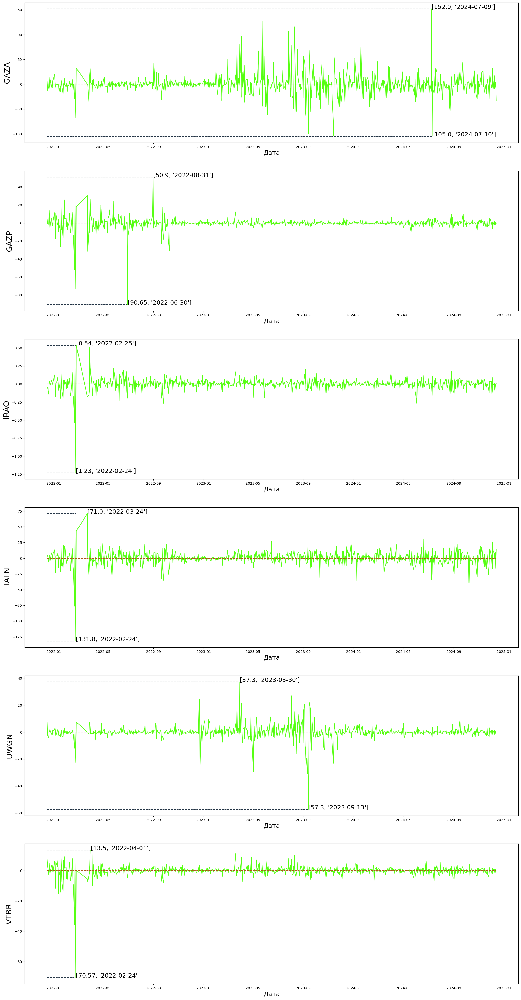

In [128]:
fig, ax = plt.subplots(6, 1, figsize=(25, 50))
x = np.array(btw_delt['Date'])

for i in range(6):
    size_1 = btw_delt[btw_delt.iloc[:, i+1] == btw_delt.iloc[:, i+1].max()].index.item()
    value_1 = btw_delt.iloc[:, i+1].max()
    size_2 = btw_delt[btw_delt.iloc[:, i+1] == btw_delt.iloc[:, i+1].min()].index.item()
    value_2 = btw_delt.iloc[:, i+1].min()
    ax[i].plot(x, btw_delt.iloc[:, i+1], color='#56ff12', linewidth=1.8)
    ax[i].plot(x, np.zeros(743).reshape(743, 1), color='#aa5511', linestyle='--')
    ax[i].plot(x[:size_1], np.full(size_1, value_1), color='#223344', linestyle='--')
    ax[i].plot(x[:size_2], np.full(size_2, value_2), color='#223344', linestyle='--')
    ax[i].set_xlabel('Дата', fontsize=18)
    ax[i].set_ylabel(btw_delt.columns[i+1], fontsize=22)
    ax[i].text(btw_delt[btw_delt.iloc[:, i+1] == btw_delt.iloc[:, i+1].max()]["Date"], btw_delt.iloc[:, i+1].max(), [round(value_1, 2), str(btw_delt[btw_delt.iloc[:, i+1] == value_1]["Date"].item())[:10]], fontsize=17)
    ax[i].text(btw_delt[btw_delt.iloc[:, i+1] == btw_delt.iloc[:, i+1].min()]["Date"], btw_delt.iloc[:, i+1].min(), [round(abs(value_2), 2), str(btw_delt[btw_delt.iloc[:, i+1] == value_2]["Date"].item())[:10]], fontsize=17)
    i += 1

plt.show()

<i>Выводы:
<br>1. В большинстве своём динамика цен была невелика, но определённые скачки были, для Горьковского Автомобильного Завода эти скачки наиболее заметны
<br>2. Наибольшее падение акций Горьковского Автомобильного Завода произошло на следующий день после самого большого роста
<br>3. Для каждой компании период самых больших колебаний цен отличается, но чаще всего это диапазон март-июнь 2022 года, а для Объединённой Вагонной Компании и Горьковского Автомобильного Завода - апрель - август 2023 года</i>

<h2>Скользящее среднее</h2>

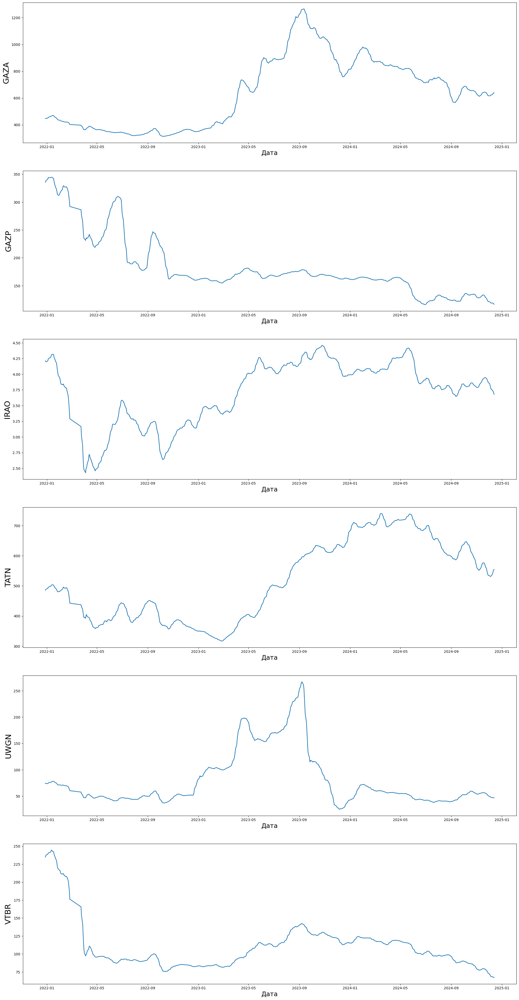

In [129]:
fig, ax = plt.subplots(6, 1, figsize=(25, 50))
x = np.array(btw_price['Date'])

for i in range(6):
    ax[i].plot(x[9:744], np.array(btw_price.iloc[:, i+1].rolling(10).mean()[9:744]).reshape(735, 1), linewidth=1.8)
    ax[i].set_xlabel('Дата', fontsize=18)
    ax[i].set_ylabel(btw_price.columns[i+1], fontsize=22)
    i += 1

plt.show()

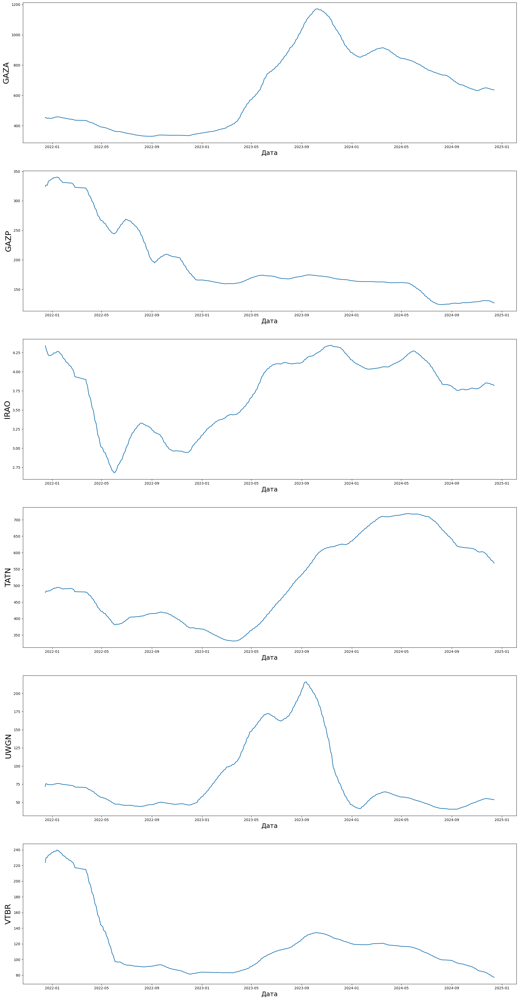

In [130]:
fig, ax = plt.subplots(6, 1, figsize=(25, 50))
x = np.array(btw_price['Date'])

for i in range(6):
    ax[i].plot(x, np.array(btw_price.iloc[:, i+1].rolling(50, min_periods=1).mean()).reshape(744, 1), linewidth=1.8)
    ax[i].set_xlabel('Дата', fontsize=18)
    ax[i].set_ylabel(btw_price.columns[i+1], fontsize=22)
    i += 1

plt.show()

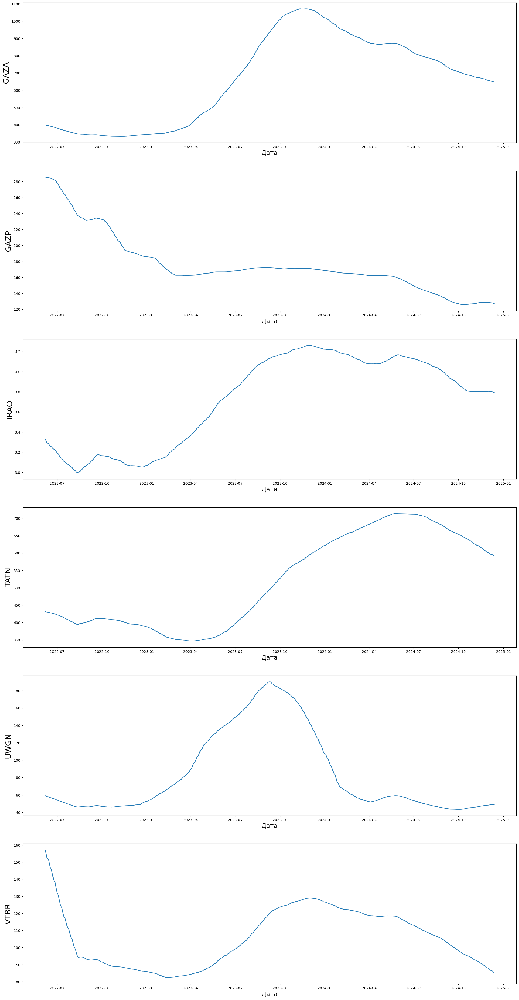

In [131]:
fig, ax = plt.subplots(6, 1, figsize=(25, 50))
x = np.array(btw_price['Date'])

for i in range(6):
    ax[i].plot(x, np.array(btw_price.iloc[:, i+1].rolling(100).mean()).reshape(744, 1), linewidth=1.8)
    ax[i].set_xlabel('Дата', fontsize=18)
    ax[i].set_ylabel(btw_price.columns[i+1], fontsize=22)
    i += 1

plt.show()

<i>Выводы:
<br>1. С учётом скользящего среднего легче заметить тенденции акций к росту или падению
<br>2. Чем больший период мы берём для подсчёта среднего, тем меньше на значение влияют скачкообразные изменения цены, и тем плавнее изображается график
<br>3. Выводы относительно тенденций к росту или снижению цены были расписаны ранее
</i>

<h2>Графики объёма транзакций</h2>

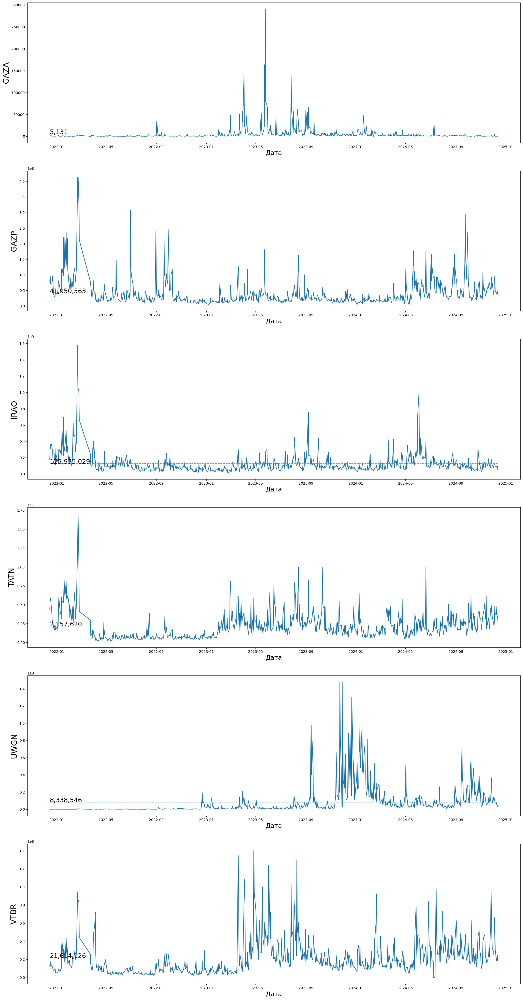

In [132]:
fig, ax = plt.subplots(6, 1, figsize=(25, 50))
x = np.array(btw_volume['Date'])

for i in range(6):
    ax[i].plot(x, btw_volume.iloc[:, i+1], linewidth=1.8)
    ax[i].plot(x, np.full([744, 1], btw_volume.iloc[:, i+1].mean()), color='#3388ff', linestyle='--', linewidth=1.4)
    ax[i].set_xlabel('Дата', fontsize=18)
    ax[i].set_ylabel(btw_volume.columns[i+1], fontsize=22)
    ax[i].text(x[0], btw_volume.iloc[:, i+1].mean(), '{:,.0f}'.format(btw_volume.iloc[:, i+1].mean()), fontsize=18)
    i += 1

plt.show()

<i>Выводы:
<br>1. Все графики очень скачкообразны, поэтому я добавил среднее количество транзакций
<br>2. По среднему количеству транзакций:
<br>2.1. Акции ГАЗ менее всего популярны на бирже
<br>2.2. Акции ИнтерРАО более всего популярны на бирже
<br>3. Активная торговля акциями объединенённой вагонной компании началась в январе 2023 года
</i>

<h2>Сводный график</h2>

In [133]:
def magnat(ticker, year):
    x_1 = np.array(btw_price.query('Date.dt.year == @year')['Date'])
    global i
    return (ax[i].plot(x_1, btw_price.query('Date.dt.year == @year')[ticker], linewidth=2.2, label='Котировка'),
    ax[i].plot(x_1, np.array(btw_price.query('Date.dt.year == @year')[ticker].rolling(50, min_periods=1).mean()).reshape(btw_price.query('Date.dt.year == @year')[ticker].shape[0], 1), linewidth=2.2, label="Скользящее среднее за 50 дней"),
    ax[i].plot(x_1, np.array(btw_price.query('Date.dt.year == @year')[ticker].rolling(100,min_periods=1).mean()).reshape(btw_price.query('Date.dt.year == @year')[ticker].shape[0], 1), linewidth=2.2, label="Скользящее среднее за 100 дней"),
    ax[i].legend(fontsize=24),
    ax[i].set_xlabel(year, fontsize=22),
    ax[i].set_ylabel(ticker, fontsize=22)
           )

[]

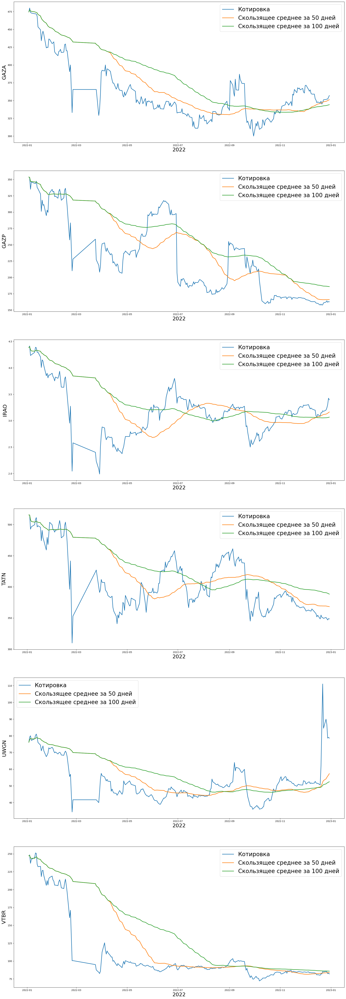

In [134]:
fig, ax = plt.subplots(6, figsize=(25, 75))

for i in range(6):
    ax[i] = magnat(btw_price.columns[i+1], 2022)
    i += 1

plt.plot()

[]

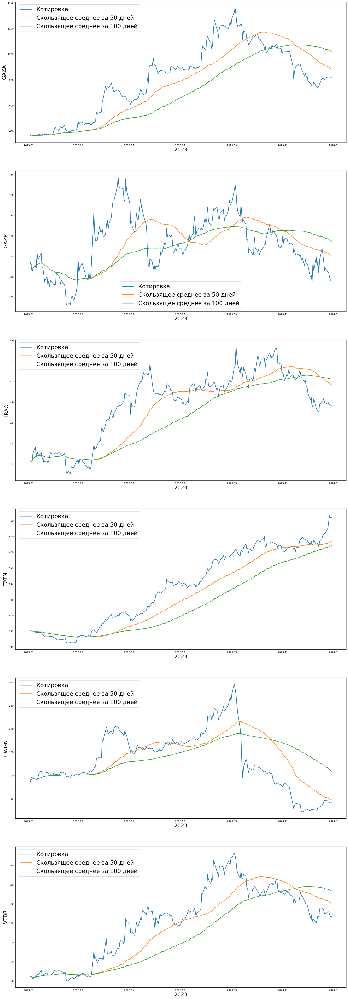

In [135]:
fig, ax = plt.subplots(6, figsize=(25, 75))

for i in range(6):
    ax[i] = magnat(btw_price.columns[i+1], 2023)
    i += 1

plt.plot()

[]

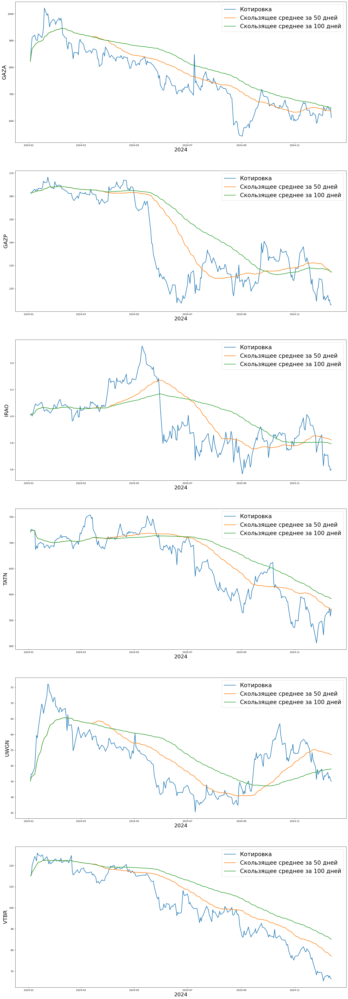

In [136]:
fig, ax = plt.subplots(6, figsize=(25, 75))

for i in range(6):
    ax[i] = magnat(btw_price.columns[i+1], 2024)
    i += 1

plt.plot()

<i>Выводы:
<br>1. Скользящее среднее запаздывает по сравнению с реальным положением дел, при чём скользящее за 100 дней правее скользящего за 50 дней
<br>2. Выводы по годам:
<br>2.1. 2022 Год: по всем акциям тенденция к падению
<br>2.2. 2023 Год: по всем акциям тенденция к роту, но у газпрома выражена слабо
<br>2.3. 2024 Год: по всем акциям тенденция к падению,  кроме ИнтерРАО (прогноз стабильный), Татнефть - до июля, затем также паденние</i>

<h2>Экспоненциальное скользящее среднее</h2>

In [137]:
btw_expo_roll = pd.DataFrame()

In [138]:
btw_expo_roll['Date'] = btw_price['Date'][1:]
btw_expo_roll['GAZA'] = btw_price['GAZA'].rolling(50, win_type='exponential', min_periods=1).mean()
btw_expo_roll['GAZP'] = btw_price['GAZP'].rolling(50, win_type='exponential', min_periods=1).mean()
btw_expo_roll['IRAO'] = btw_price['IRAO'].rolling(50, win_type='exponential', min_periods=1).mean()
btw_expo_roll['TATN'] = btw_price['TATN'].rolling(50, win_type='exponential', min_periods=1).mean()
btw_expo_roll['UWGN'] = btw_price['UWGN'].rolling(50, win_type='exponential', min_periods=1).mean()
btw_expo_roll['VTBR'] = btw_price['VTBR'].rolling(50, win_type='exponential', min_periods=1).mean()
btw_expo_roll

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR
1,2021-12-16,453.613649,325.246448,4.328070,480.321977,73.582590,225.918102
2,2021-12-17,452.883172,325.431331,4.321311,480.977222,73.845246,226.692986
3,2021-12-20,452.470156,325.446355,4.314617,480.990776,73.786090,226.857511
4,2021-12-21,452.487988,325.614597,4.312768,481.028183,73.775762,226.972237
5,2021-12-22,452.488039,325.699717,4.312227,481.062221,73.772449,227.018790
...,...,...,...,...,...,...,...
739,2024-12-09,607.819266,128.893659,3.845818,551.572419,54.358072,77.362997
740,2024-12-10,614.641296,130.787781,3.863204,560.432524,54.923172,77.987376
741,2024-12-11,622.702959,133.162834,3.888959,571.934742,55.839289,78.760968
742,2024-12-12,634.243551,134.932714,3.915211,582.497150,56.798079,79.589918


<style>
    .ssylka {
        background-color: purple;
	color: yellow;
	fontsize: 18px;
    }
</style>

<style>
    .main-txt {
        background-color: yellow;
	color: purple;
	fontsize: 18px;
    }
</style>


<style>
    .ssylka {
        background-color: purple;
	color: yellow;
	fontsize: 18px;
    }
</style>

<style>
    .main-txt {
        background-color: yellow;
	color: purple;
	fontsize: 18px;
    }
</style>


<u><div class="main-txt">Для сравнения, в </div><a href='https://docs.scipy.org/doc/scipy/reference/signal.windows.html#module-scipy.signal.windows'><div class="ssylka">Ссылка -> Документации к библиотеке SciPy</div></a><div class="main-txt">, на которую ссылается </div><a href='https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.rolling.html#pandas.DataFrame.rolling'><div class="ssylka">Ссылка -> Pandas</div></a><div class="main-txt">, я нашёл другиее значения win_type, и решил сравнить что скользящее среднее действительно будет отлично от экспоненциального и с win_type=None</div></u>

<u>У меня здесь не работает CSS, я делал текст на фиолетовом и жёлтом фонах</u>


In [139]:
btw_roll = pd.DataFrame()
btw_roll['Date'] = btw_price['Date'][1:]
btw_roll['GAZA'] = btw_price['GAZA'].rolling(50, win_type='hann', min_periods=1).mean()
btw_roll['GAZP'] = btw_price['GAZP'].rolling(50, win_type='bartlett', min_periods=1).mean()
btw_roll['IRAO'] = btw_price['IRAO'].rolling(50, win_type='hamming', min_periods=1).mean()
btw_roll['TATN'] = btw_price['TATN'].rolling(50, min_periods=1).mean()
btw_roll['UWGN'] = btw_price['UWGN'].rolling(50, win_type='parzen', min_periods=1).mean()
btw_roll['VTBR'] = btw_price['VTBR'].rolling(50, win_type='bohman', min_periods=1).mean()
btw_roll

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR
1,2021-12-16,452.000000,324.090000,4.318740,481.200000,71.950000,223.975000
2,2021-12-17,453.203954,325.523333,4.299007,483.333333,72.966667,224.781309
3,2021-12-20,453.253228,326.058333,4.260437,482.850000,73.726008,225.886573
4,2021-12-21,452.524956,326.203000,4.248131,483.120000,74.157388,226.875342
5,2021-12-22,451.820981,327.172667,4.244370,484.100000,74.368466,227.675803
...,...,...,...,...,...,...,...
739,2024-12-09,633.462247,129.757283,3.855765,575.292000,55.312943,78.998289
740,2024-12-10,632.709101,129.481583,3.856846,573.658000,55.220622,78.696948
741,2024-12-11,632.037135,129.182767,3.857868,572.146000,55.112253,78.393365
742,2024-12-12,631.450177,128.853267,3.858169,570.322000,54.980346,78.081625


[]

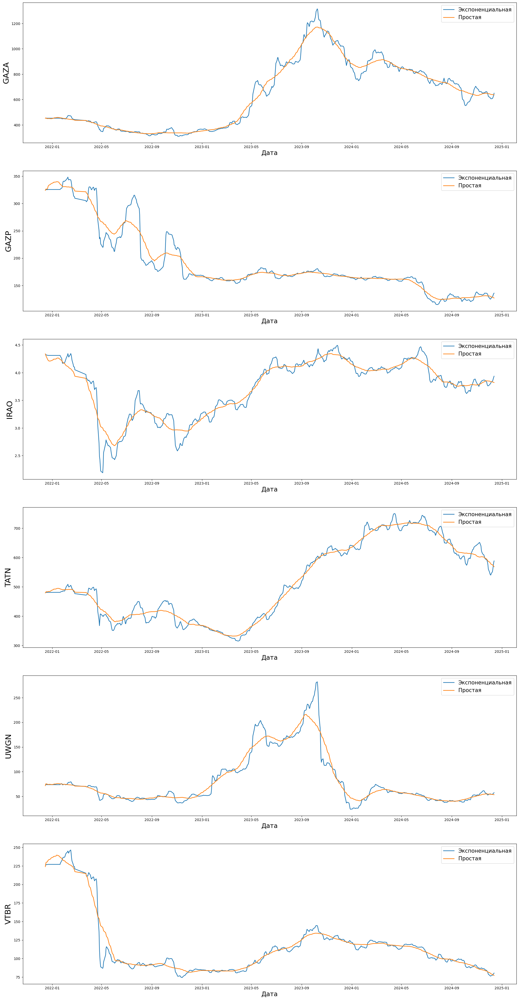

In [140]:
x = np.array(btw_price['Date'])
fig, ax = plt.subplots(6, 1, figsize=(25, 50))

for i in range(6):
    ax[i].plot(x[1:], np.array(btw_expo_roll.iloc[:, i+1]).reshape(743, 1), linewidth=1.8, label='Экспоненциальная')
    ax[i].plot(x, np.array(btw_price.iloc[:, i+1].rolling(50, min_periods=1).mean()).reshape(744, 1), linewidth=1.8, label='Простая')
    ax[i].set_xlabel('Дата', fontsize=18)
    ax[i].set_ylabel(btw_expo_roll.columns[i+1], fontsize=22)
    ax[i].legend(fontsize=15)
    i += 1

plt.plot()

<i>Вывод: экспоненциальная скользящая средняя лучше учитывает скачки цены (график выглядит менее плавным)</i>

<h2>Расчёт RSI</h2>

In [141]:
btw_expo_roll_up = pd.DataFrame()
btw_expo_roll_up['Date'] = btw_delt['Date']
btw_expo_roll_up['GAZA'] = btw_delt['GAZA'].where(btw_delt['GAZA'] > 0, 0).rolling(50, win_type='exponential', min_periods=1).mean().fillna(0).apply(lambda x: round(x, 4))
btw_expo_roll_up['GAZP'] = btw_delt['GAZP'].where(btw_delt['GAZP'] > 0, 0).rolling(50, win_type='exponential', min_periods=1).mean().fillna(0).apply(lambda x: round(x, 4))
btw_expo_roll_up['IRAO'] = btw_delt['IRAO'].where(btw_delt['IRAO'] > 0, 0).rolling(50, win_type='exponential', min_periods=1).mean().fillna(0).apply(lambda x: round(x, 4))
btw_expo_roll_up['TATN'] = btw_delt['TATN'].where(btw_delt['TATN'] > 0, 0).rolling(50, win_type='exponential', min_periods=1).mean().fillna(0).apply(lambda x: round(x, 4))
btw_expo_roll_up['UWGN'] = btw_delt['UWGN'].where(btw_delt['UWGN'] > 0, 0).rolling(50, win_type='exponential', min_periods=1).mean().fillna(0).apply(lambda x: round(x, 4))
btw_expo_roll_up['VTBR'] = btw_delt['VTBR'].where(btw_delt['VTBR'] > 0, 0).rolling(50, win_type='exponential', min_periods=1).mean().fillna(0).apply(lambda x: round(x, 4))
btw_expo_roll_up

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR
0,2021-12-16,6.0000,4.3000,0.0000,3.8000,7.0000,7.2250
1,2021-12-17,4.3864,3.1436,0.0000,3.9883,5.1174,6.1761
2,2021-12-20,3.9914,2.8605,0.0000,3.6292,4.6567,5.6201
3,2021-12-21,4.3123,3.2170,0.0014,3.6026,4.5363,5.5962
4,2021-12-22,4.2620,3.2456,0.0017,3.6166,4.4845,5.5447
...,...,...,...,...,...,...,...
738,2024-12-09,5.0533,1.7987,0.0170,7.5651,0.3169,0.5750
739,2024-12-10,8.0357,1.9432,0.0187,9.7270,0.6494,0.6586
740,2024-12-11,8.8844,2.4496,0.0274,12.0270,0.9541,0.8058
741,2024-12-12,12.3230,1.9507,0.0300,11.3149,0.9917,0.8942


In [142]:
btw_expo_roll_up[btw_expo_roll_up['GAZA'].isna()]

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR


In [143]:
btw_expo_roll_up[btw_expo_roll_up['GAZP'].isna()]

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR


In [144]:
btw_expo_roll_up[btw_expo_roll_up['IRAO'].isna()]

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR


In [145]:
btw_expo_roll_up[btw_expo_roll_up['TATN'].isna()]

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR


In [146]:
btw_expo_roll_up[btw_expo_roll_up['UWGN'].isna()]

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR


In [147]:
btw_expo_roll_up[btw_expo_roll_up['VTBR'].isna()]

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR


In [148]:
btw_expo_roll_down = pd.DataFrame()
btw_expo_roll_down['Date'] = btw_delt['Date']
btw_expo_roll_down['GAZA'] = btw_delt['GAZA'].where(btw_delt['GAZA'] < 0, 0).rolling(50, win_type='exponential', min_periods=1).mean().fillna(0).apply(lambda x: round(abs(x), 4))
btw_expo_roll_down['GAZP'] = btw_delt['GAZP'].where(btw_delt['GAZP'] < 0, 0).rolling(50, win_type='exponential', min_periods=1).mean().fillna(0).apply(lambda x: round(abs(x), 4))
btw_expo_roll_down['IRAO'] = btw_delt['IRAO'].where(btw_delt['IRAO'] < 0, 0).rolling(50, win_type='exponential', min_periods=1).mean().fillna(0).apply(lambda x: round(abs(x), 4))
btw_expo_roll_down['TATN'] = btw_delt['TATN'].where(btw_delt['TATN'] < 0, 0).rolling(50, win_type='exponential', min_periods=1).mean().fillna(0).apply(lambda x: round(abs(x), 4))
btw_expo_roll_down['UWGN'] = btw_delt['UWGN'].where(btw_delt['UWGN'] < 0, 0).rolling(50, win_type='exponential', min_periods=1).mean().fillna(0).apply(lambda x: round(abs(x), 4))
btw_expo_roll_down['VTBR'] = btw_delt['VTBR'].where(btw_delt['VTBR'] < 0, 0).rolling(50, win_type='exponential', min_periods=1).mean().fillna(0).apply(lambda x: round(abs(x), 4))
btw_expo_roll_down

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR
0,2021-12-16,0.0000,0.0000,0.0425,0.0000,0.0000,0.0000
1,2021-12-17,3.3618,0.2931,0.0429,0.0000,0.5917,0.0000
2,2021-12-20,3.5543,0.3928,0.0517,0.5582,0.9435,0.2431
3,2021-12-21,3.4403,0.3802,0.0500,0.5403,0.9133,0.2353
4,2021-12-22,3.4177,0.3758,0.0494,0.5340,0.9026,0.2325
...,...,...,...,...,...,...,...
738,2024-12-09,2.9227,0.0769,0.0024,1.0102,0.2222,0.0733
739,2024-12-10,1.2136,0.0491,0.0013,0.8669,0.0843,0.0342
740,2024-12-11,0.8227,0.0745,0.0016,0.5247,0.0380,0.0322
741,2024-12-12,0.7824,0.1809,0.0038,0.7525,0.0329,0.0653


In [149]:
btw_expo_roll_down[btw_expo_roll_down['GAZA'].isna()]

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR


In [150]:
btw_expo_roll_down[btw_expo_roll_down['GAZP'].isna()]

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR


In [151]:
btw_expo_roll_down[btw_expo_roll_down['IRAO'].isna()]

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR


In [152]:
btw_expo_roll_down[btw_expo_roll_down['TATN'].isna()]

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR


In [153]:
btw_expo_roll_down[btw_expo_roll_down['UWGN'].isna()]

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR


In [154]:
btw_expo_roll_down[btw_expo_roll_down['VTBR'].isna()]

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR


In [155]:
btw_RSI = pd.DataFrame()
btw_RSI['Date'] = pd.to_datetime(btw_delt['Date'])

In [156]:
btw_RSI['GAZA'] = 100 - 100 / (1 + (btw_expo_roll_up['GAZA'] / btw_expo_roll_down['GAZA'])).apply(lambda x: round(x, 2))
btw_RSI['GAZP'] = 100 - 100 / (1 + (btw_expo_roll_up['GAZP'] / btw_expo_roll_down['GAZP'])).apply(lambda x: round(x, 2))
btw_RSI['IRAO'] = 100 - 100 / (1 + (btw_expo_roll_up['IRAO'] / btw_expo_roll_down['IRAO'])).apply(lambda x: round(x, 2))
btw_RSI['TATN'] = 100 - 100 / (1 + (btw_expo_roll_up['TATN'] / btw_expo_roll_down['TATN'])).apply(lambda x: round(x, 2))
btw_RSI['UWGN'] = 100 - 100 / (1 + (btw_expo_roll_up['UWGN'] / btw_expo_roll_down['UWGN'])).apply(lambda x: round(x, 2))
btw_RSI['VTBR'] = 100 - 100 / (1 + (btw_expo_roll_up['VTBR'] / btw_expo_roll_down['VTBR'])).apply(lambda x: round(x, 2))
btw_RSI

,Date,GAZA,GAZP,IRAO,TATN,UWGN,VTBR
0,2021-12-16,100.000000,100.000000,0.000000,100.000000,100.000000,100.000000
1,2021-12-17,56.521739,91.474851,0.000000,100.000000,89.637306,100.000000
2,2021-12-20,52.830189,87.922705,0.000000,86.666667,83.164983,95.854063
3,2021-12-21,55.555556,89.429175,2.912621,86.962190,83.249581,95.964487
4,2021-12-22,55.555556,89.626556,2.912621,87.129987,83.249581,95.975855
...,...,...,...,...,...,...,...
738,2024-12-09,63.369963,95.899959,87.623762,88.221437,58.847737,88.687783
739,2024-12-10,86.876640,97.535732,93.498049,91.816694,88.505747,95.064166
740,2024-12-11,91.525424,97.048406,94.481236,95.819398,96.170050,96.156802
741,2024-12-12,94.029851,91.511036,88.751406,93.765586,96.788696,93.192648


[]

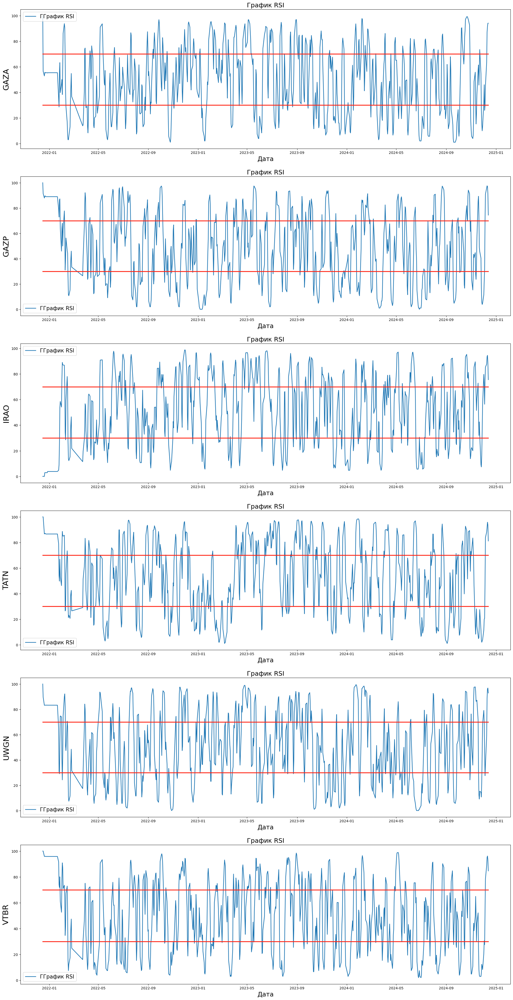

In [157]:
x = np.array(btw_RSI['Date'])
fig, ax = plt.subplots(6, 1, figsize=(25, 50))

for i in range(6):
    ax[i].plot(x, np.array(btw_RSI.iloc[:, i+1]).reshape(743, 1), linewidth=1.8, label='ГГрафик RSI')
    ax[i].plot(x, np.full(743, 70), color='#ff2212', linewidth=2.4) 
    ax[i].plot(x, np.full(743, 30), color='#ff2212', linewidth=2.4) 
    ax[i].set_title('График RSI', fontsize=18)
    ax[i].set_xlabel('Дата', fontsize=18)
    ax[i].set_ylabel(btw_RSI.columns[i+1], fontsize=22)
    ax[i].legend(fontsize=15)
    i += 1

plt.plot()

<i>Вывод:
<br>1. Очень страшные графики
<br>2. Если бы мы знали, что это такое, но мы не знаем, что это такое
<br>3. Но я так понимаю, что сейчас все рассмтриваемые активы переоценены</i>

<h2>Функция для нескольких графиков</h2>

In [165]:
def financier(ticker, year):
    x_1 = np.array(btw_price.query('Date.dt.year == @year')['Date'])
    global i
    global j
    return (
        ax[i, j].plot(x_1, btw_price.query('Date.dt.year == @year')[ticker], linewidth=2.2, label='Котировка'),
        ax[i, j].plot(x_1, np.array(btw_price.query('Date.dt.year == @year')[ticker].rolling(50, win_type='exponential', min_periods=1).mean()).reshape(btw_price.query('Date.dt.year == @year')[ticker].shape[0], 1), linewidth=2.2, label="Скользящая средняя экспоненциальная за 50 дней"),
        ax[i, j].plot(x_1, np.array(btw_price.query('Date.dt.year == @year')[ticker].rolling(50,win_type='hann', min_periods=1).mean()).reshape(btw_price.query('Date.dt.year == @year')[ticker].shape[0], 1), linewidth=2.2, label="Скользящая средняя Ханна за 50 дней"),
        ax[i, j].legend(fontsize=16),
        ax[i, j].set_title('График цены'),
        ax[i, j].set_xlabel(year, fontsize=22),
        ax[i, j].set_ylabel(ticker, fontsize=22),
        ax[i, j+1].plot(x_1, np.array(btw_RSI.query('Date.dt.year == @year').iloc[:btw_RSI.query('Date.dt.year == @year').shape[0], i+1]).reshape(btw_RSI.query('Date.dt.year == @year').shape[0], 1), linewidth=1.8, label='График RSI'),
        ax[i, j+1].plot(x_1, np.full(btw_RSI.query('Date.dt.year == @year').shape[0], 70), color='#ff2212', linewidth=2.4),
        ax[i, j+1].plot(x_1, np.full(btw_RSI.query('Date.dt.year == @year').shape[0], 30), color='#ff2212', linewidth=2.4),
        ax[i, j+1].legend(fontsize=16),
        ax[i, j+1].set_title('График RSI'),
        ax[i, j+1].set_xlabel(year, fontsize=22),
        ax[i, j+1].set_ylabel(ticker, fontsize=22)
           )

[]

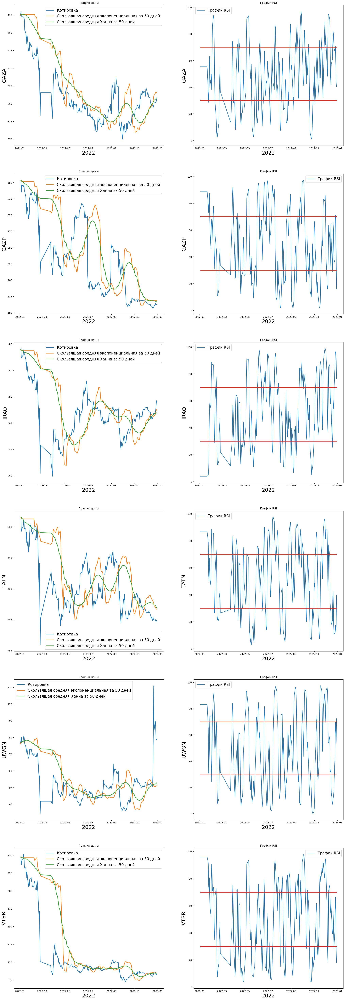

In [166]:
fig, ax = plt.subplots(6, 2, figsize=(25, 75))

for i in range(6):
    j = 0
    ax[i, j] = financier(btw_price.columns[i+1], 2022)
    i += 1

plt.plot()

[]

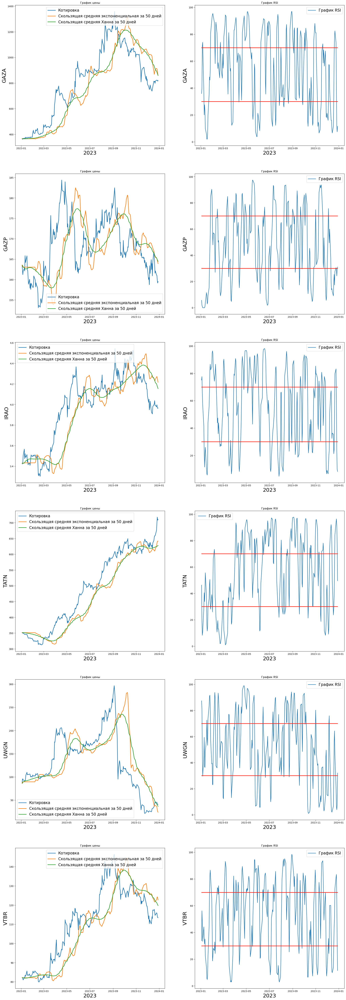

In [167]:
fig, ax = plt.subplots(6, 2, figsize=(25, 75))

for i in range(6):
    j = 0
    ax[i, j] = financier(btw_price.columns[i+1], 2023)
    i += 1

plt.plot()

[]

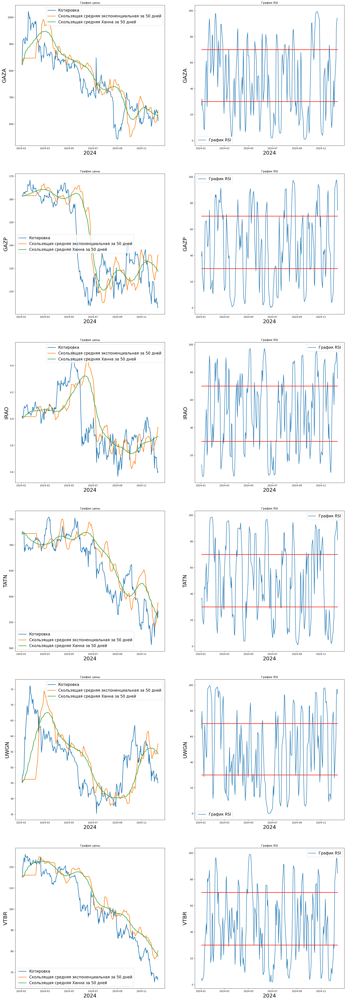

In [168]:
fig, ax = plt.subplots(6, 2, figsize=(25, 75))

for i in range(6):
    j = 0
    ax[i, j] = financier(btw_price.columns[i+1], 2024)
    i += 1

plt.plot()

<i>
<br>Выводы по графикам котировок:
<br>1. Скользящая средняя Ханна слабише реагирует на резкие колебания цены, нежели экспоненциальная
</i>
<p>
<i>
<br>Выводы по графикам RSI    
<br>1. В течение указанного периода колебания RSI для всех акций были значительными, и значения RSI часто оказывались за пределами установленной границы (30:70)
</i>
<p>
<i>
<br>Смежные выводы:
<br>1. При отклонении RSI ниже 30 наступал рост стоимости акции
<br>2. При отклонении RSI выше 70 наступало падение цены акции
</i>